In [1]:
from tensorflow import keras
from PIL import Image
from matplotlib import pyplot as plt
import numpy as np
import os
from tqdm import tqdm

In [2]:
#圖取整個之前train好的模型
model = keras.models.load_model('model.h5')

In [3]:
#這是之前train時 .flow_from_directory 使用 .class_indices 找到的label
dictionary = {'apple_pie': 0, 'baby_back_ribs': 1, 'baklava': 2, 'beef_carpaccio': 3, 'beef_tartare': 4, 'beet_salad': 5, 'beignets': 6, 'bibimbap': 7, 'bread_pudding': 8, 'breakfast_burrito': 9, 'bruschetta': 10, 'caesar_salad': 11, 'cannoli': 12, 'caprese_salad': 13, 'carrot_cake': 14, 'ceviche': 15, 'cheese_plate': 16, 'cheesecake': 17, 'chicken_curry': 18, 'chicken_quesadilla': 19, 'chicken_wings': 20, 'chocolate_cake': 21, 'chocolate_mousse': 22, 'churros': 23, 'clam_chowder': 24, 'club_sandwich': 25, 'crab_cakes': 26, 'creme_brulee': 27, 'croque_madame': 28, 'cup_cakes': 29, 'deviled_eggs': 30, 'donuts': 31, 'dumplings': 32, 'edamame': 33, 'eggs_benedict': 34, 'escargots': 35, 'falafel': 36, 'filet_mignon': 37, 'fish_and_chips': 38, 'foie_gras': 39, 'french_fries': 40, 'french_onion_soup': 41, 'french_toast': 42, 'fried_calamari': 43, 'fried_rice': 44, 'frozen_yogurt': 45, 'garlic_bread': 46, 'gnocchi': 47, 'greek_salad': 48, 'grilled_cheese_sandwich': 49, 'grilled_salmon': 50, 'guacamole': 51, 'gyoza': 52, 'hamburger': 53, 'hot_and_sour_soup': 54, 'hot_dog': 55, 'huevos_rancheros': 56, 'hummus': 57, 'ice_cream': 58, 'lasagna': 59, 'lobster_bisque': 60, 'lobster_roll_sandwich': 61, 'macaroni_and_cheese': 62, 'macarons': 63, 'miso_soup': 64, 'mussels': 65, 'nachos': 66, 'omelette': 67, 'onion_rings': 68, 'oysters': 69, 'pad_thai': 70, 'paella': 71, 'pancakes': 72, 'panna_cotta': 73, 'peking_duck': 74, 'pho': 75, 'pizza': 76, 'pork_chop': 77, 'poutine': 78, 'prime_rib': 79, 'pulled_pork_sandwich': 80, 'ramen': 81, 'ravioli': 82, 'red_velvet_cake': 83, 'risotto': 84, 'samosa': 85, 'sashimi': 86, 'scallops': 87, 'seaweed_salad': 88, 'shrimp_and_grits': 89, 'spaghetti_bolognese': 90, 'spaghetti_carbonara': 91, 'spring_rolls': 92, 'steak': 93, 'strawberry_shortcake': 94, 'sushi': 95, 'tacos': 96, 'takoyaki': 97, 'tiramisu': 98, 'tuna_tartare': 99, 'waffles': 100}

In [4]:
def preprocess(path):
    img = Image.open(path)
    img = img.resize((299, 299))
    img = ((np.array(img)/255)-0.5)*2
    img = np.expand_dims(img, axis=0)
    return img

In [5]:
test_path = './test'
labels = os.listdir(test_path)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:12<00:00,  8.24it/s]


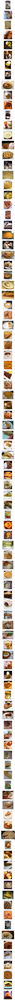

In [6]:
prediction_arr_all = []
true_arr_all = []
correct_num = 0
total_num = 0
i=0
true_label = 'apple_pie' #apple_pie(s) only!

#Let's setup the subplots
fig, ax = plt.subplots(100, 1, figsize=(10, 500)) 

for img in tqdm(os.listdir(test_path + '/' + true_label)):
    img_for_prediction = preprocess(test_path + '/' + true_label + '/' + img)
    arr = model.predict(img_for_prediction)
    predict_label = list(dictionary.keys())[np.argmax(arr)]
    prediction_arr_all.append(predict_label)
    true_arr_all.append(true_label)
    if(predict_label == true_label):
        correct_num+=1
    total_num+=1
    print_img = Image.open(test_path + '/' + true_label + '/' + img)
    
    ax[i].set_title(predict_label)
    ax[i].imshow(print_img)
    i+=1
plt.show()

In [7]:
print("accuracy on apple_pie = " + str(correct_num/total_num))

accuracy on apple_pie = 0.26
